data at: https://www.kaggle.com/datasets/aditmagotra/gameplay-images/data
our model at: https://drive.google.com/drive/folders/14ukKETtvOU4jRsdQ_P5GgEke3wmFHMzW?usp=sharing

In [1]:

import os
import numpy as np
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, random_split
import torch.optim as optim
import torch.nn as nn
import copy
import wandb
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns


In [2]:
seed = 69
torch.manual_seed(seed)
np.random.seed(seed)

In [3]:
# load Dataset
data_path = 'data/Dataset'
data_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    #https://stackoverflow.com/questions/58151507/why-pytorch-officially-use-mean-0-485-0-456-0-406-and-std-0-229-0-224-0-2
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


In [4]:
data_transformsCentralCrop = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    #https://stackoverflow.com/questions/58151507/why-pytorch-officially-use-mean-0-485-0-456-0-406-and-std-0-229-0-224-0-2
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [5]:
dataset = datasets.ImageFolder(root=data_path, transform=data_transforms)
dataset_centralCrop = datasets.ImageFolder(root=data_path, transform=data_transformsCentralCrop)

train_ds, val_ds, test_ds = random_split(dataset, [0.7, 0.1, 0.2], generator=torch.Generator().manual_seed(69))
_, _, test_ds_cc = random_split(dataset_centralCrop, [0.7, 0.1, 0.2], generator=torch.Generator().manual_seed(69))

train_dataloader = DataLoader(train_ds, shuffle=True, num_workers=16)
test_dataloader = DataLoader(test_ds_cc)
val_dataloader = DataLoader(val_ds)


In [6]:
# alexnet model from https://github.com/pytorch/vision/blob/main/torchvision/models/alexnet.py
class AlexModel(nn.Module):
    def __init__(self, num_classes=10, dropout=0.5):
        super(AlexModel, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [7]:
class AlexModelv2(nn.Module):
    def __init__(self, num_classes=10, dropout=0.5):
        super(AlexModelv2, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 384, kernel_size=3, padding=1),  # +1 Conv2d layer
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [8]:
class AlexModelv3(nn.Module):
    def __init__(self, num_classes=10, dropout=0.5):
        super(AlexModelv3, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),  # Added another Conv2d layerhere (so +2 total)
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [9]:
class AlexModelv4(nn.Module):
    def __init__(self, num_classes=10, dropout=0.5):
        super(AlexModelv4, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            # Removed the two 256 Conv layers here and changed to output to 256
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [10]:
class AlexModelv5(nn.Module):
    # removed one 256 conv layer
    def __init__(self, num_classes=10, dropout=0.5):
        super(AlexModelv5, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True), 
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [11]:
class AlexModelv6(nn.Module):
    def __init__(self, num_classes=10, dropout=0.5):
        super(AlexModelv6, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            # 3 layers less
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(192 * 6 * 6, 4096),  # Adjusted input s
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [12]:
models = [AlexModel, AlexModelv2, AlexModelv3, AlexModelv4, AlexModelv5, AlexModelv6]

In [13]:
#device = torch.device("cuda:0")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# models[0].to(device)

#Below we will test all the models 

Test Accuracy: 96.95%
Test Loss: 0.1059


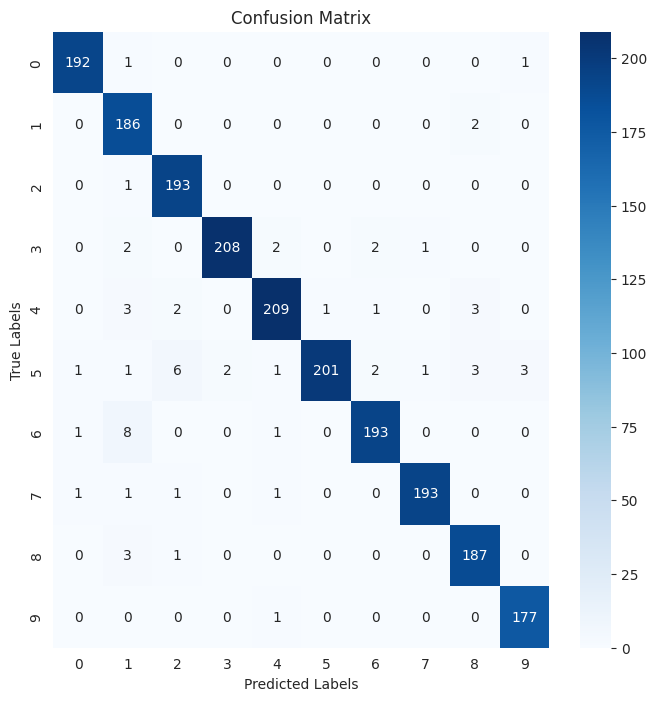

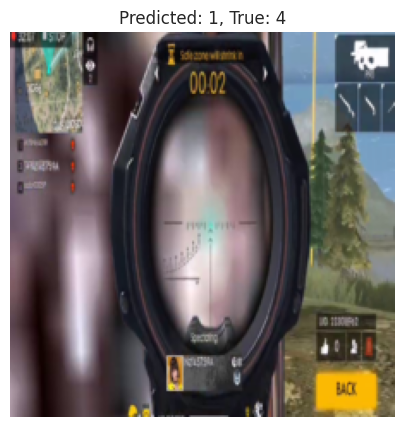

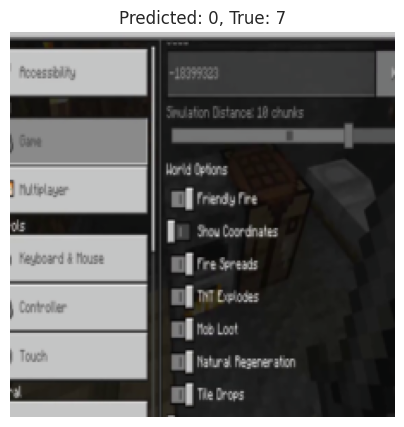

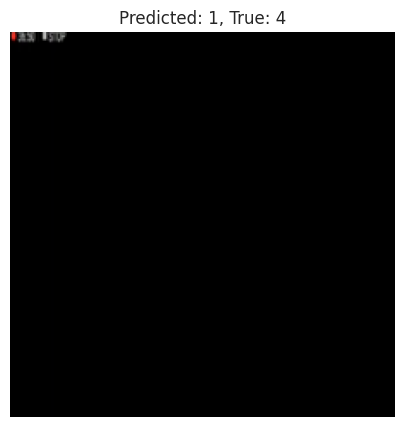

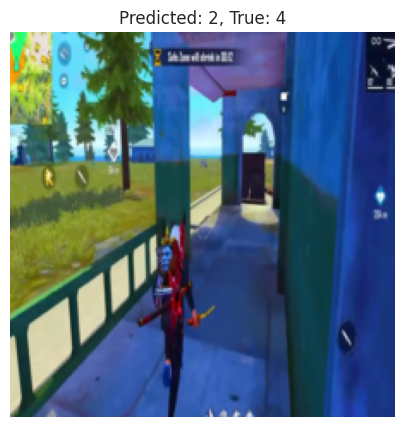

...

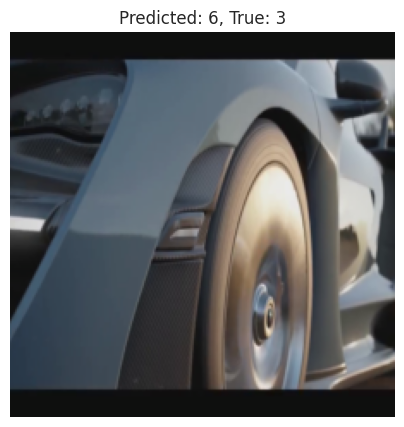

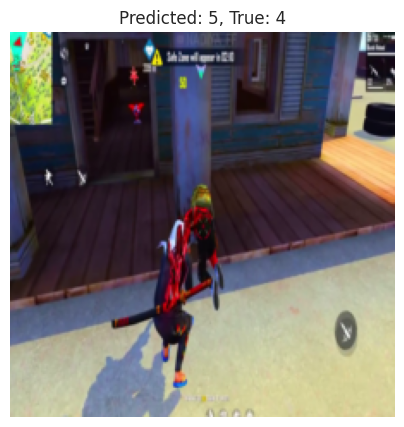

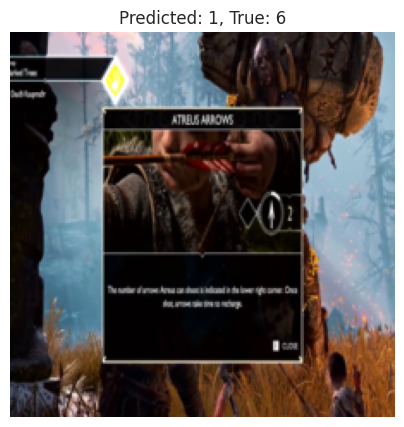

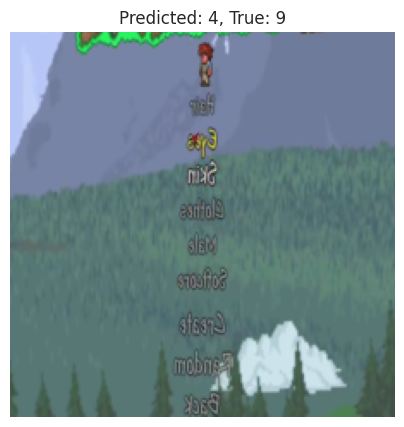

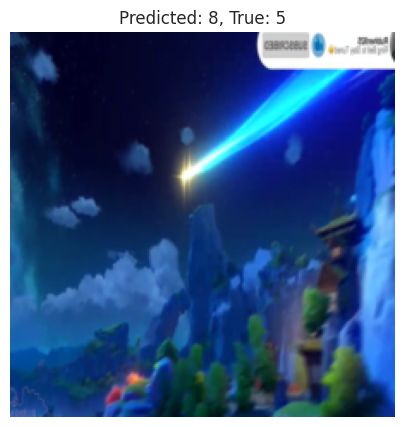

In [14]:
# og alexnet
model = models[0]()
model.to(device)
model_path = 'models/model_final_alex.pth'
model.load_state_dict(torch.load(model_path))


model.eval()

test_loss = 0
correct = 0
total = 0
missclassified = []
all_predicted = []
all_targets = []


with torch.no_grad():
    for i, (data, target) in enumerate(test_dataloader):
        # predicting
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
        all_predicted.extend(predicted.cpu().numpy())
        all_targets.extend(target.cpu().numpy())
        
        mismatches = (predicted != target)
        missclassified.extend([idx + i * test_dataloader.batch_size for idx, mismatch in enumerate(mismatches) if mismatch])

        # loss
        loss = nn.CrossEntropyLoss()(outputs, target)
        test_loss += loss.item()


test_accuracy = 100 * correct / total
test_loss /= len(test_dataloader.dataset)

print(f'Test Accuracy: {test_accuracy:.2f}%')
print(f'Test Loss: {test_loss:.4f}')

# Compute confusion matrix
conf_matrix = confusion_matrix(all_targets, all_predicted)
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', ax=ax, cmap='Blues')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title('Confusion Matrix')
plt.show()

# some misclassified images
num_images_to_show = 14
for index in missclassified[:num_images_to_show]:
    img, true_label = test_dataloader.dataset[index % len(test_dataloader.dataset)]
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'Predicted: {all_predicted[index]}, True: {all_targets[index]}')
    plt.axis('off')
    plt.show()


# to be sure
# remove model from memory
del model
# clear gpu memory
torch.cuda.empty_cache()

Test Accuracy: 96.05%
Test Loss: 0.1301


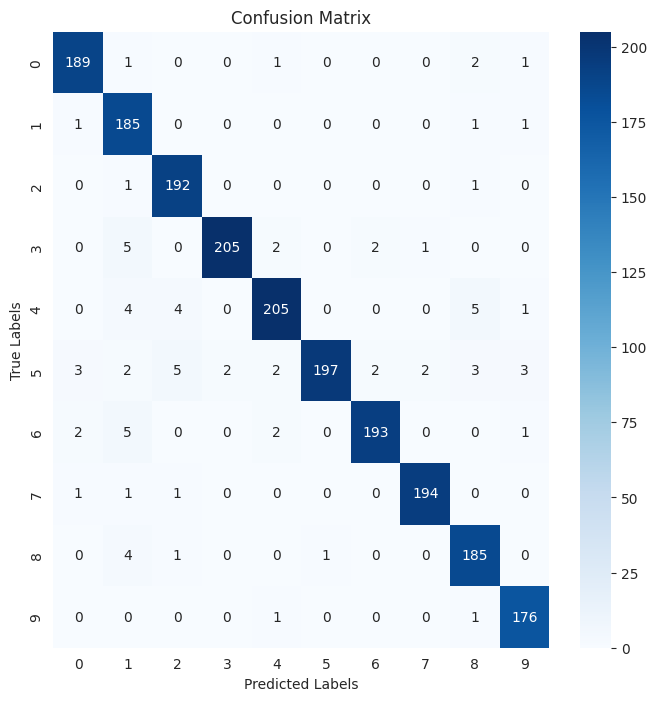

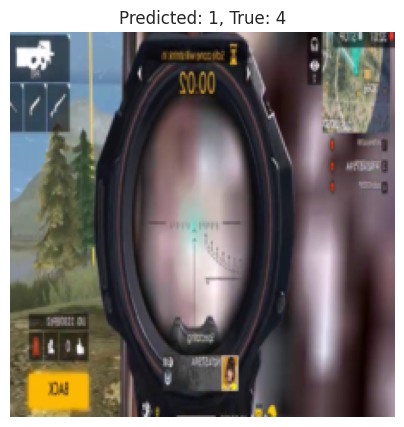

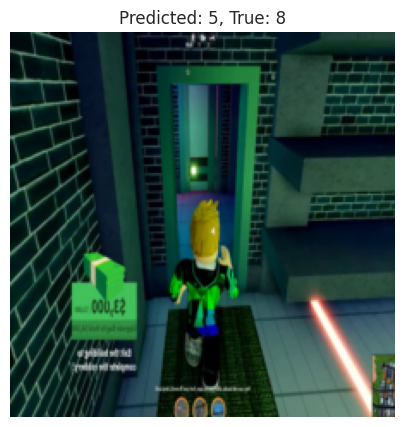

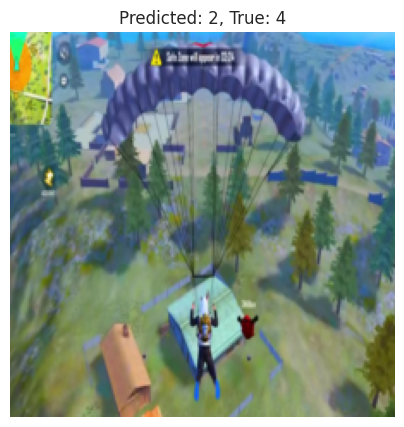

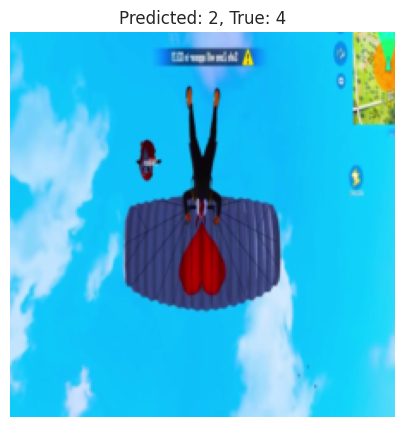

...

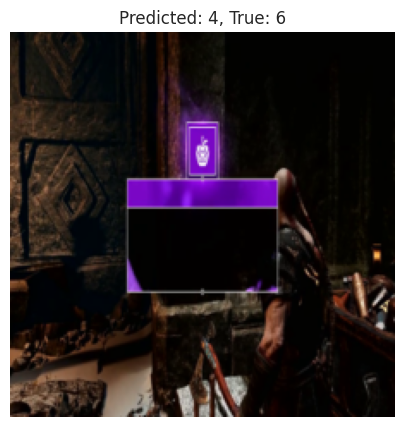

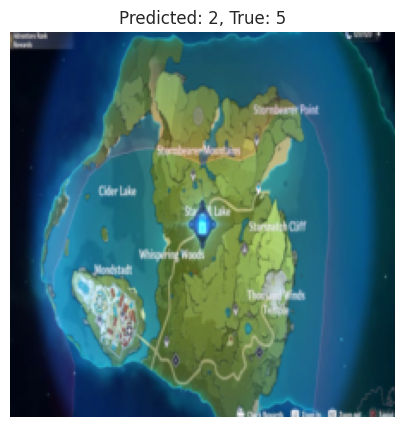

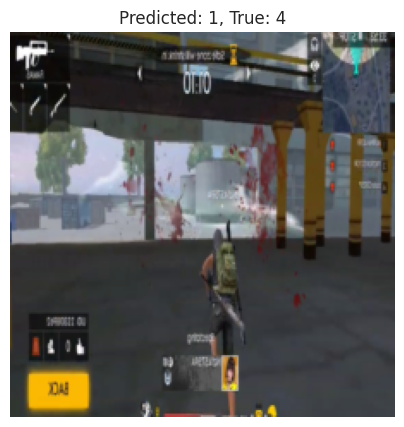

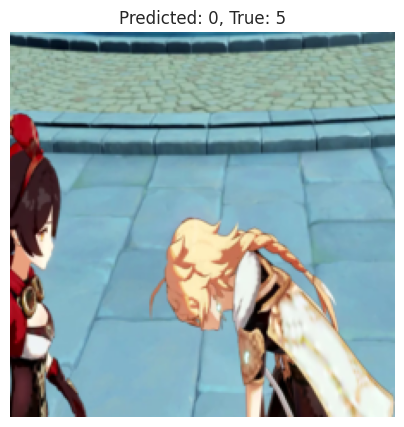

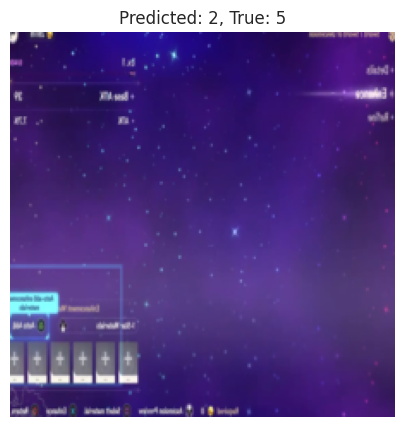

In [15]:
# minus one conv layer
model = models[4]()
model.to(device)
model_path = 'models/model_final_minus1.pth'
model.load_state_dict(torch.load(model_path))


model.eval()

test_loss = 0
correct = 0
total = 0
missclassified = []
all_predicted = []
all_targets = []


with torch.no_grad():
    for i, (data, target) in enumerate(test_dataloader):
        # predicting
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
        all_predicted.extend(predicted.cpu().numpy())
        all_targets.extend(target.cpu().numpy())
        
        mismatches = (predicted != target)
        missclassified.extend([idx + i * test_dataloader.batch_size for idx, mismatch in enumerate(mismatches) if mismatch])

        # loss
        loss = nn.CrossEntropyLoss()(outputs, target)
        test_loss += loss.item()


test_accuracy = 100 * correct / total
test_loss /= len(test_dataloader.dataset)

print(f'Test Accuracy: {test_accuracy:.2f}%')
print(f'Test Loss: {test_loss:.4f}')

# Compute confusion matrix
conf_matrix = confusion_matrix(all_targets, all_predicted)
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', ax=ax, cmap='Blues')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title('Confusion Matrix')
plt.show()

# some misclassified images
num_images_to_show = 14
for index in missclassified[:num_images_to_show]:
    img, true_label = test_dataloader.dataset[index % len(test_dataloader.dataset)]
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'Predicted: {all_predicted[index]}, True: {all_targets[index]}')
    plt.axis('off')
    plt.show()


# to be sure
# remove model from memory
del model
# clear gpu memory
torch.cuda.empty_cache()

Test Accuracy: 97.40%
Test Loss: 0.0898


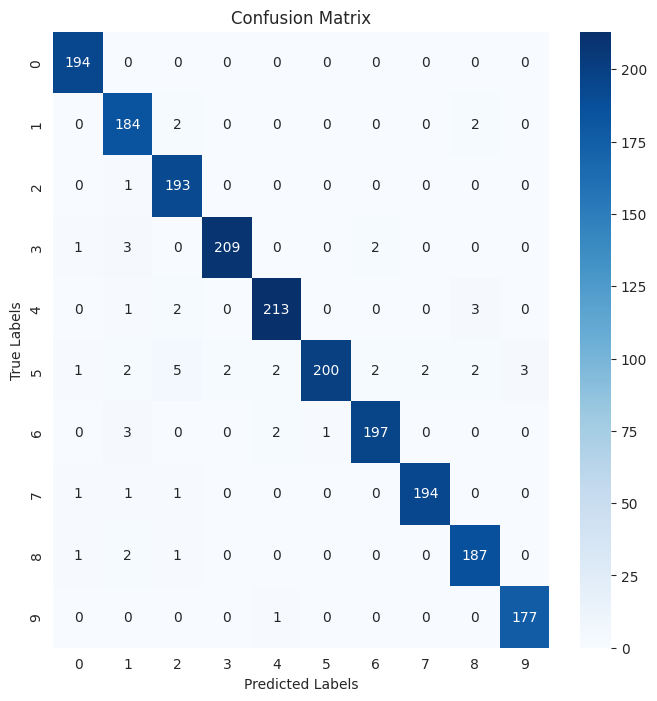

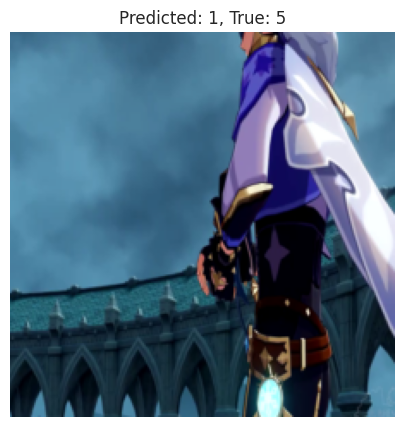

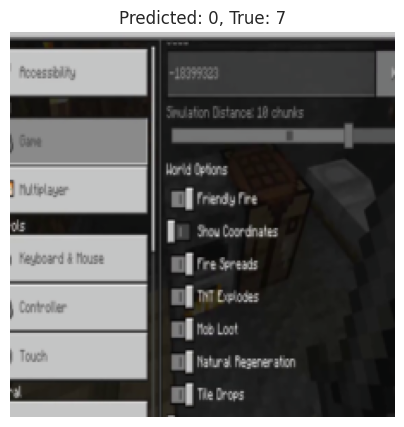

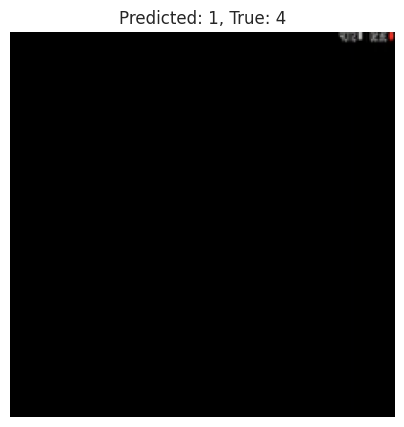

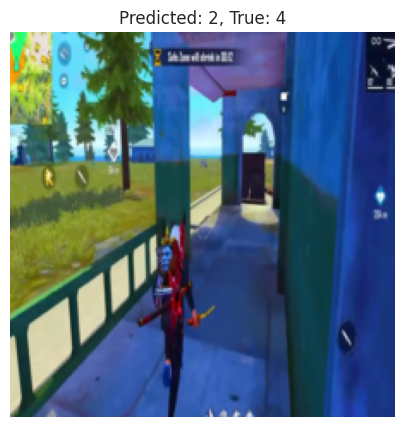

...

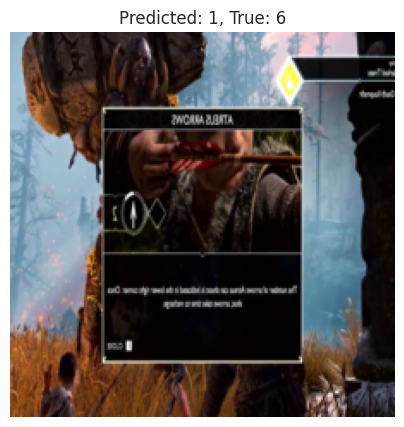

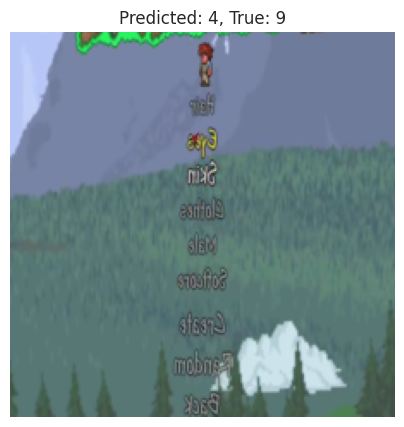

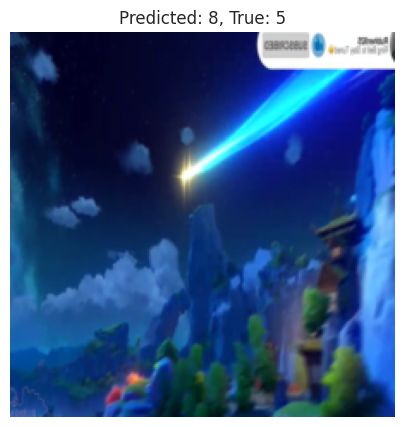

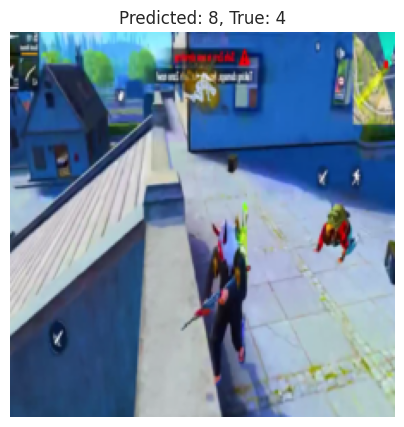

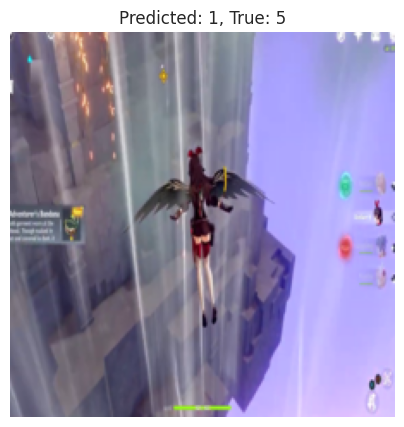

In [16]:
# minus two conv layer
model = models[3]()
model.to(device)
model_path = 'models/model_final_minus2.pth'
model.load_state_dict(torch.load(model_path))


model.eval()

test_loss = 0
correct = 0
total = 0
missclassified = []
all_predicted = []
all_targets = []


with torch.no_grad():
    for i, (data, target) in enumerate(test_dataloader):
        # predicting
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
        all_predicted.extend(predicted.cpu().numpy())
        all_targets.extend(target.cpu().numpy())
        
        mismatches = (predicted != target)
        missclassified.extend([idx + i * test_dataloader.batch_size for idx, mismatch in enumerate(mismatches) if mismatch])

        # loss
        loss = nn.CrossEntropyLoss()(outputs, target)
        test_loss += loss.item()


test_accuracy = 100 * correct / total
test_loss /= len(test_dataloader.dataset)

print(f'Test Accuracy: {test_accuracy:.2f}%')
print(f'Test Loss: {test_loss:.4f}')

# Compute confusion matrix
conf_matrix = confusion_matrix(all_targets, all_predicted)
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', ax=ax, cmap='Blues')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title('Confusion Matrix')
plt.show()

# some misclassified images
num_images_to_show = 14
for index in missclassified[:num_images_to_show]:
    img, true_label = test_dataloader.dataset[index % len(test_dataloader.dataset)]
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'Predicted: {all_predicted[index]}, True: {all_targets[index]}')
    plt.axis('off')
    plt.show()


# to be sure
# remove model from memory
del model
# clear gpu memory
torch.cuda.empty_cache()

Test Accuracy: 97.45%
Test Loss: 0.0953


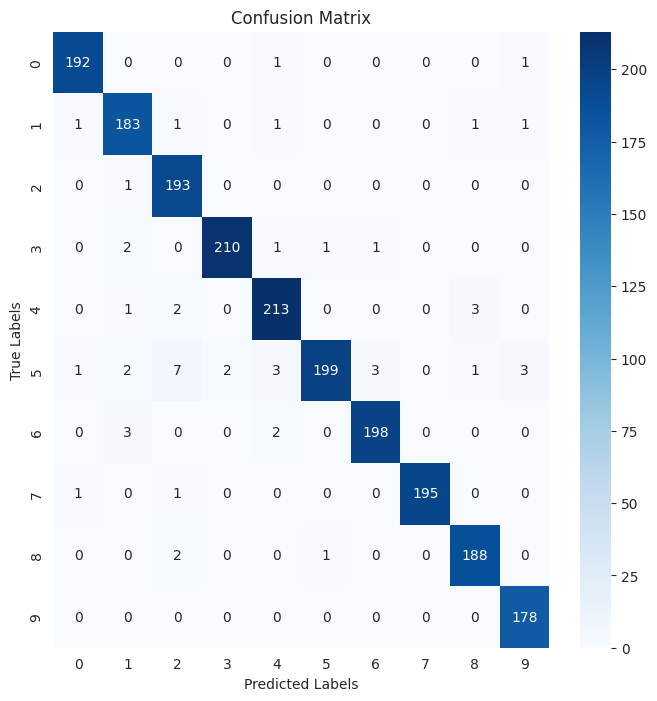

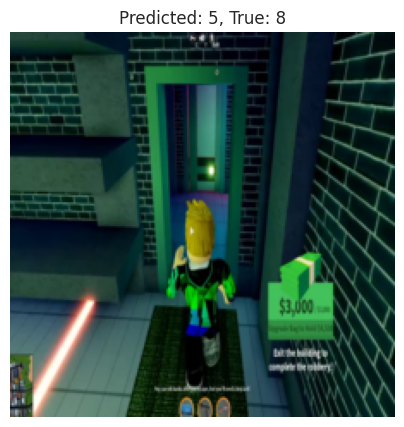

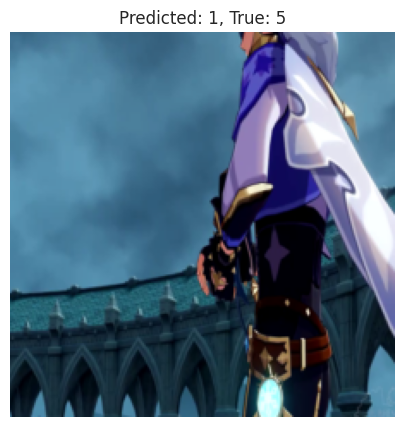

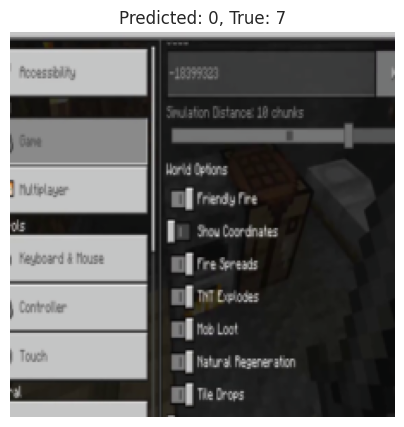

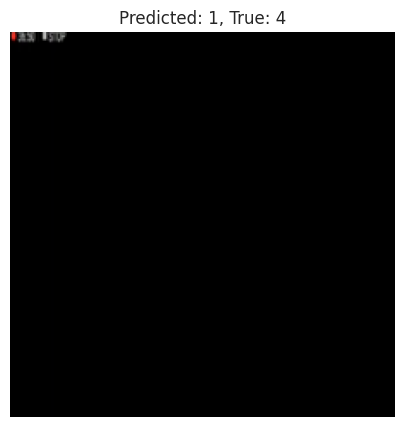

...

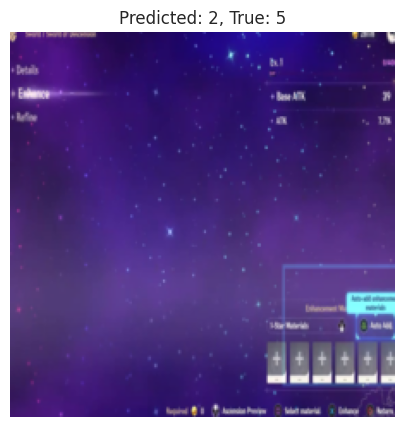

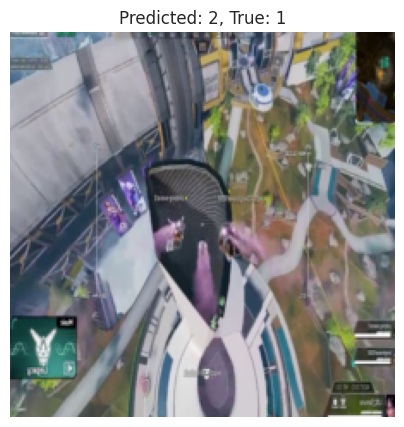

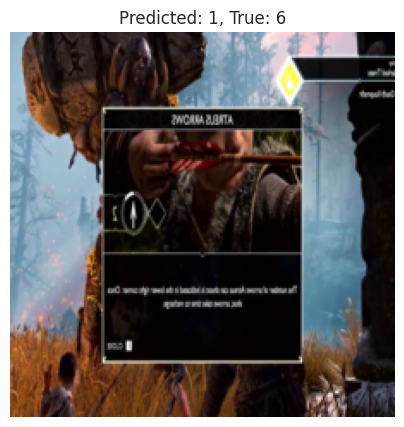

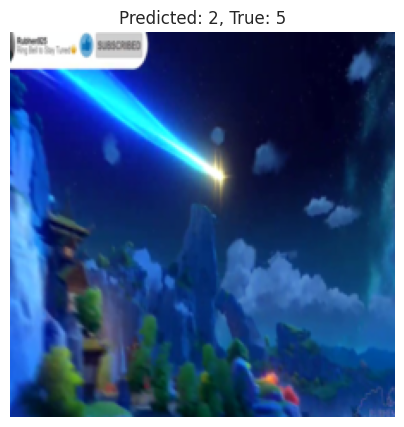

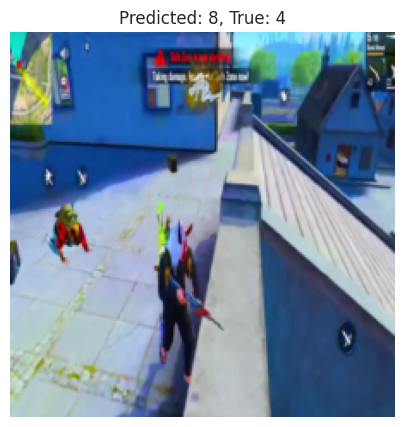

In [17]:
# minus 3 conv layer
model = models[5]()
model.to(device)
model_path = 'models/model_final_minus3.pth'
model.load_state_dict(torch.load(model_path))


model.eval()

test_loss = 0
correct = 0
total = 0
missclassified = []
all_predicted = []
all_targets = []


with torch.no_grad():
    for i, (data, target) in enumerate(test_dataloader):
        # predicting
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
        all_predicted.extend(predicted.cpu().numpy())
        all_targets.extend(target.cpu().numpy())
        
        mismatches = (predicted != target)
        missclassified.extend([idx + i * test_dataloader.batch_size for idx, mismatch in enumerate(mismatches) if mismatch])

        # loss
        loss = nn.CrossEntropyLoss()(outputs, target)
        test_loss += loss.item()


test_accuracy = 100 * correct / total
test_loss /= len(test_dataloader.dataset)

print(f'Test Accuracy: {test_accuracy:.2f}%')
print(f'Test Loss: {test_loss:.4f}')

# Compute confusion matrix
conf_matrix = confusion_matrix(all_targets, all_predicted)
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', ax=ax, cmap='Blues')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title('Confusion Matrix')
plt.show()

# some misclassified images
num_images_to_show = 14
for index in missclassified[:num_images_to_show]:
    img, true_label = test_dataloader.dataset[index % len(test_dataloader.dataset)]
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'Predicted: {all_predicted[index]}, True: {all_targets[index]}')
    plt.axis('off')
    plt.show()


# to be sure
# remove model from memory
del model
# clear gpu memory
torch.cuda.empty_cache()

Test Accuracy: 96.55%
Test Loss: 0.1169


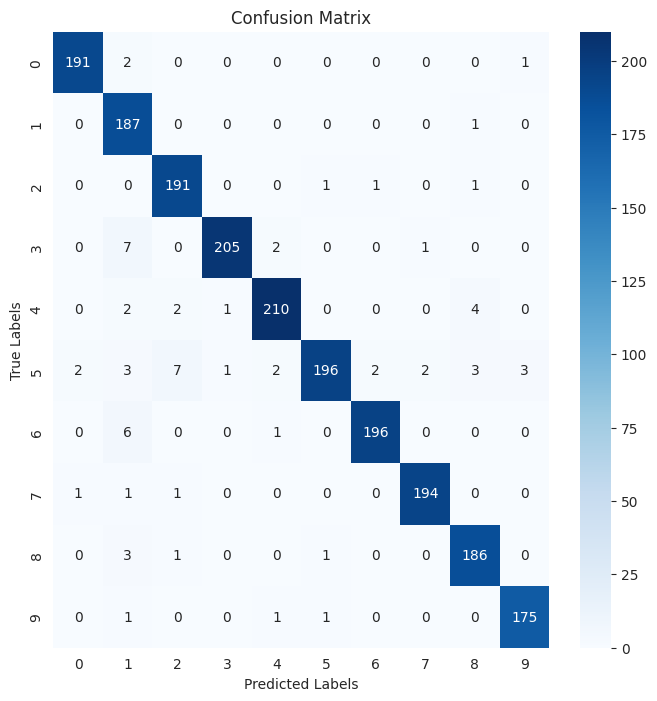

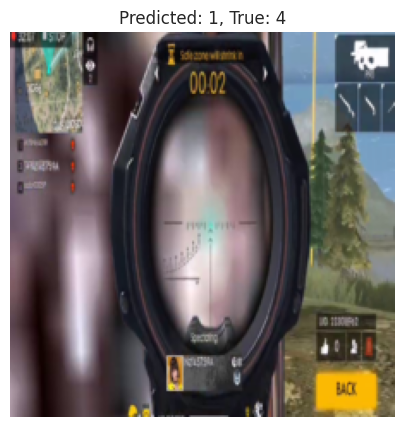

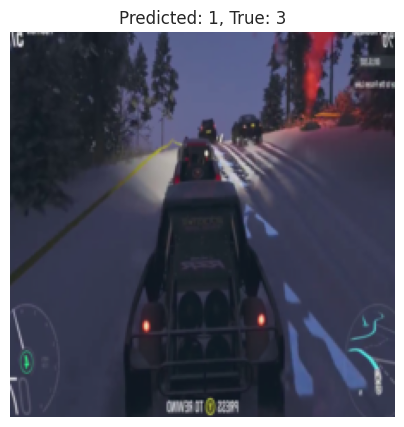

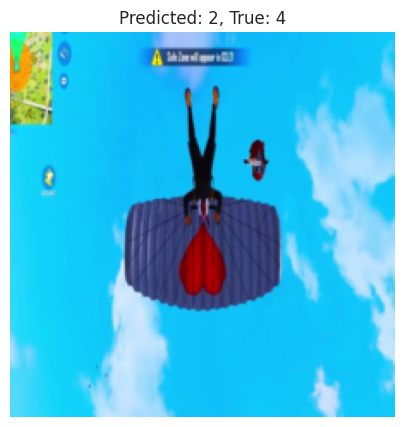

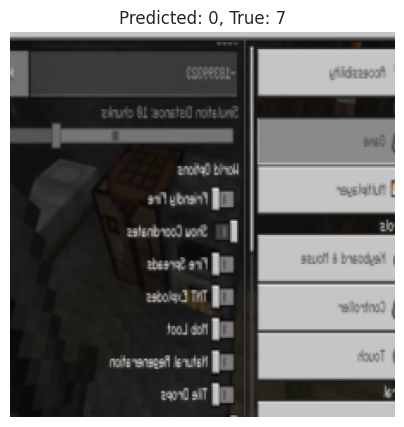

...

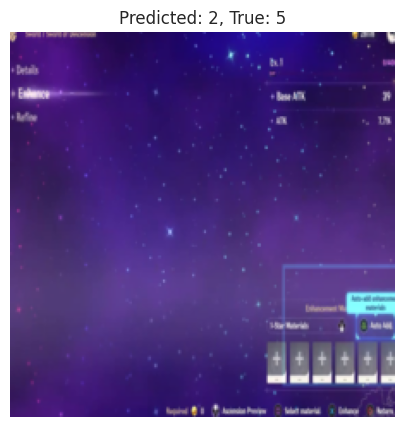

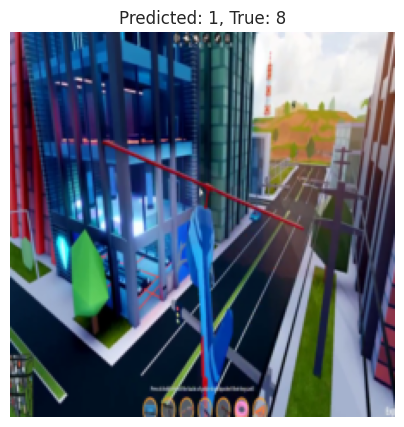

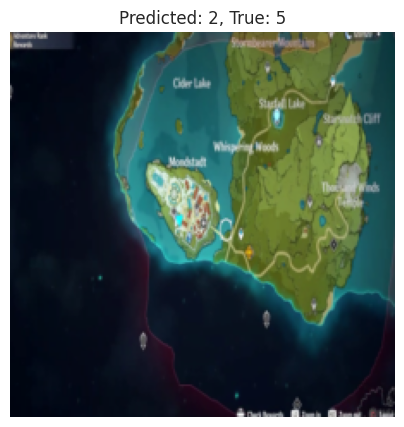

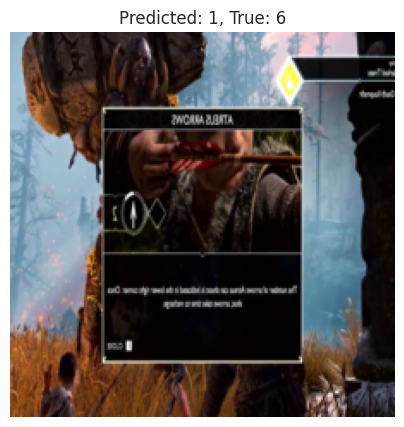

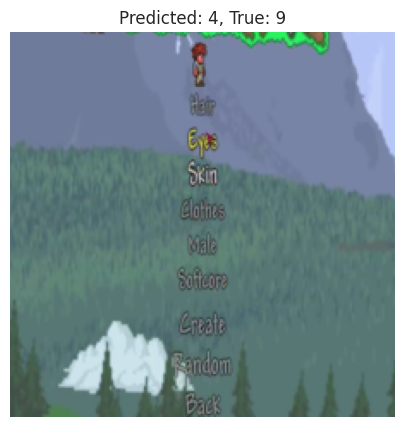

In [18]:
# plus one conv layer
model = models[1]()
model.to(device)
model_path = 'models/model_final_plus1.pth'
model.load_state_dict(torch.load(model_path))


model.eval()

test_loss = 0
correct = 0
total = 0
missclassified = []
all_predicted = []
all_targets = []


with torch.no_grad():
    for i, (data, target) in enumerate(test_dataloader):
        # predicting
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
        all_predicted.extend(predicted.cpu().numpy())
        all_targets.extend(target.cpu().numpy())
        
        mismatches = (predicted != target)
        missclassified.extend([idx + i * test_dataloader.batch_size for idx, mismatch in enumerate(mismatches) if mismatch])

        # loss
        loss = nn.CrossEntropyLoss()(outputs, target)
        test_loss += loss.item()


test_accuracy = 100 * correct / total
test_loss /= len(test_dataloader.dataset)

print(f'Test Accuracy: {test_accuracy:.2f}%')
print(f'Test Loss: {test_loss:.4f}')

# Compute confusion matrix
conf_matrix = confusion_matrix(all_targets, all_predicted)
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', ax=ax, cmap='Blues')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title('Confusion Matrix')
plt.show()

# some misclassified images
num_images_to_show = 14
for index in missclassified[:num_images_to_show]:
    img, true_label = test_dataloader.dataset[index % len(test_dataloader.dataset)]
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'Predicted: {all_predicted[index]}, True: {all_targets[index]}')
    plt.axis('off')
    plt.show()


# to be sure
# remove model from memory
del model
# clear gpu memory
torch.cuda.empty_cache()

Test Accuracy: 92.55%
Test Loss: 0.2231


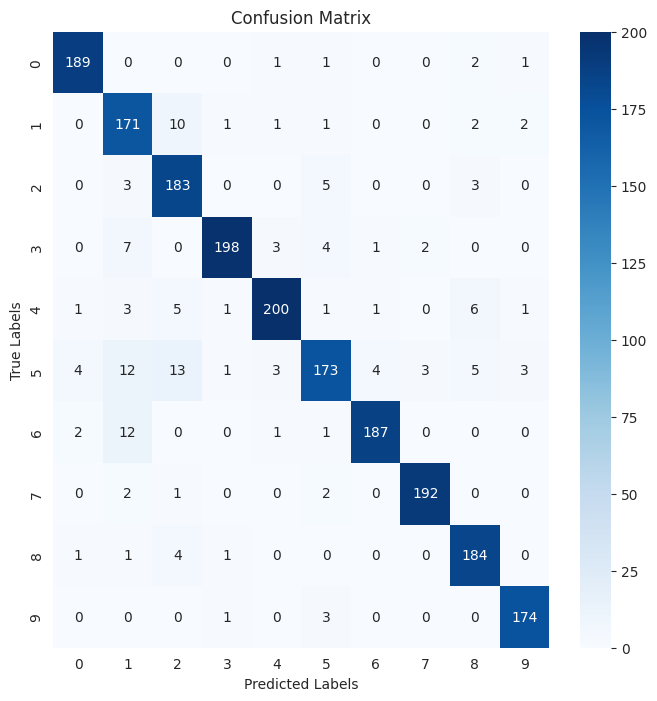

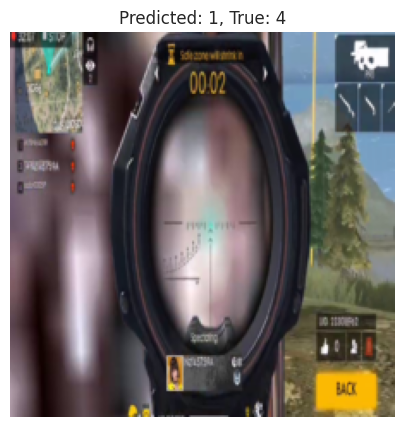

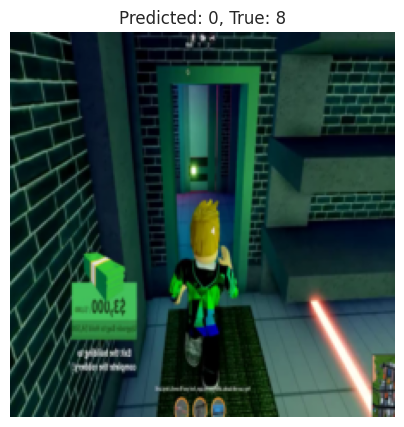

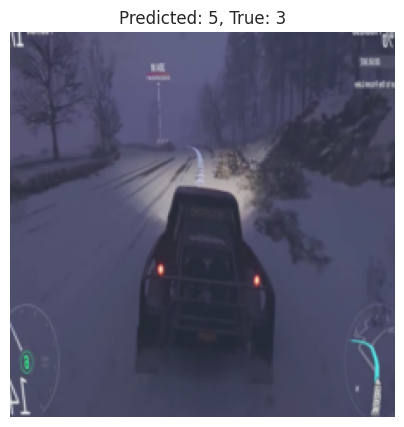

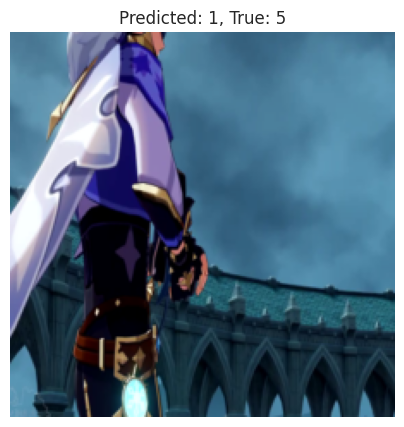

...

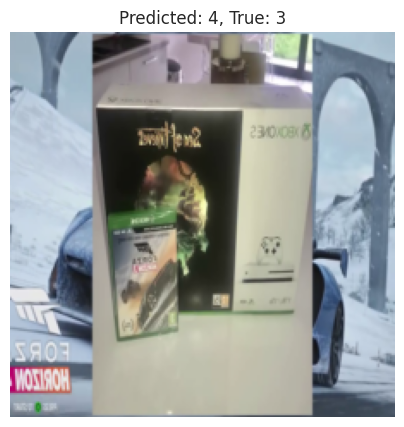

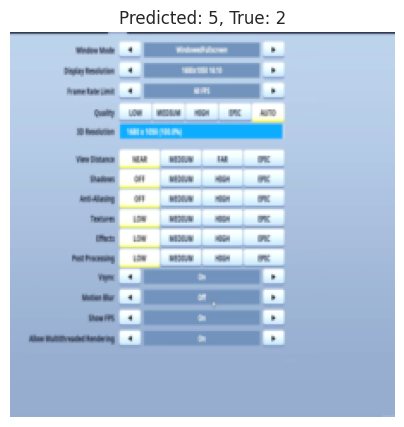

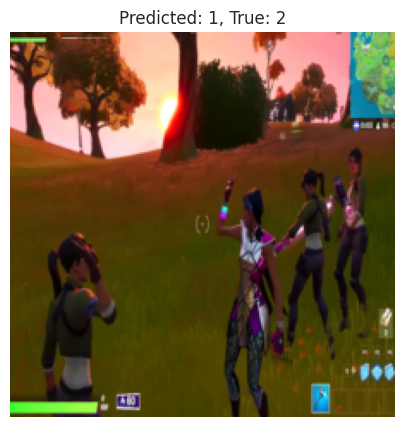

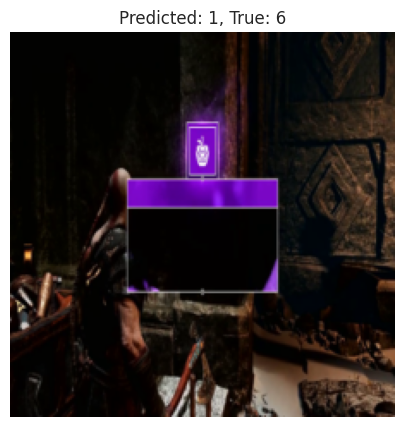

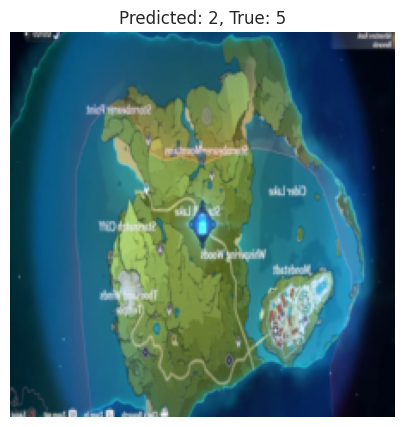

In [19]:
# plus two conv layer
model = models[2]()
model.to(device)
model_path = 'models/model_final_plus2.pth'
model.load_state_dict(torch.load(model_path))


model.eval()

test_loss = 0
correct = 0
total = 0
missclassified = []
all_predicted = []
all_targets = []


with torch.no_grad():
    for i, (data, target) in enumerate(test_dataloader):
        # predicting
        data, target = data.to(device), target.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
        all_predicted.extend(predicted.cpu().numpy())
        all_targets.extend(target.cpu().numpy())
        
        mismatches = (predicted != target)
        missclassified.extend([idx + i * test_dataloader.batch_size for idx, mismatch in enumerate(mismatches) if mismatch])

        # loss
        loss = nn.CrossEntropyLoss()(outputs, target)
        test_loss += loss.item()


test_accuracy = 100 * correct / total
test_loss /= len(test_dataloader.dataset)

print(f'Test Accuracy: {test_accuracy:.2f}%')
print(f'Test Loss: {test_loss:.4f}')

# Compute confusion matrix
conf_matrix = confusion_matrix(all_targets, all_predicted)
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', ax=ax, cmap='Blues')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title('Confusion Matrix')
plt.show()

# some misclassified images
num_images_to_show = 14
for index in missclassified[:num_images_to_show]:
    img, true_label = test_dataloader.dataset[index % len(test_dataloader.dataset)]
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'Predicted: {all_predicted[index]}, True: {all_targets[index]}')
    plt.axis('off')
    plt.show()


# to be sure
# remove model from memory
del model
# clear gpu memory
torch.cuda.empty_cache()